In [1]:
from PIL import Image
import pandas as pd
import numpy as np
import requests
import os
import torch
from transformers import pipeline, infer_device
from torch.nn.functional import cosine_similarity
import cv2
from google.colab.patches import cv2_imshow
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate
from skimage.filters import gaussian
from skimage.filters import sobel
from skimage.filters import threshold_otsu
from skimage.filters import threshold_local
from skimage import img_as_float
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Descomponiendo la carpeta zip con los datos
!unzip -q "/content/Catalogo.zip" -d "/content/Catalogo_2"

replace /content/Catalogo_2/Catalogo/Datos/Catalogo.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [4]:
# Este codigo nos permite utilizar cuda la GPU nvidia, se utiliza para mover el modelo a la GPU en casode ser necesario y si esta disponible.
DEVICE = infer_device()

In [5]:
# Cargar el manifiesto CSV
df_catalogo = pd.read_csv("/content/Catalogo_2/Catalogo/Datos/Catalogo.csv")
# Definir la ruta a las imágenes
ruta_imagenes = "/content/Catalogo_2/Catalogo/Imagenes"

In [6]:
# Aqui creamos las rutas y probamos una imagen
for i in range(len(df_catalogo)):
  # Cargar una imagen de ejemplo
  primera_fila = df_catalogo.iloc[i]
  nombre_archivo = primera_fila["nombre_imagen "]
  etiqueta = primera_fila["clase"]
  # Construir la ruta completa
  ruta_completa = os.path.join(ruta_imagenes, nombre_archivo)
  # Cargar la imagen
  img = Image.open(ruta_completa)

## **Prueba Modelo Vit**

In [7]:
from transformers import AutoImageProcessor, AutoModel
# Este el procesador de las imagenes, se utiliza para preperar las imagenes para el modelo las utilice. Las Redimenciona, normaliza y los convierte en tensores es para como un API.
processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224")
# Este es un modelo desarrollado por Goolgle con arquitectura vit de tamaño base el cual se enfoca en las imagenes en parches de 16X16 y el tamaño de las imagenes son 224x224
model = AutoModel.from_pretrained("google/vit-base-patch16-224").to(DEVICE)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use

In [8]:
# Esta función se aplica para inferir las similitudes entre las imagenes.
def infer(image):
  inputs = processor(image, return_tensors="pt").to(DEVICE)
  outputs = model(**inputs)
  return outputs.pooler_output

In [9]:
# Estas imagenes las selecciomos para realizar la pruba.
image_a = Image.open("imagen_personas1.jpg")
image_b = Image.open("imagen_personas2.jpg")

In [10]:
# Aplicamos las función a las imagenes selecionadas.
embed_real = infer(image_a)
embed_gen = infer(image_b)

In [11]:
# Aplicamos la función para calcular la similitud
similarity_score = cosine_similarity(embed_real, embed_gen, dim=1)
print(similarity_score)

tensor([0.2612], grad_fn=<SumBackward1>)


## **Prueba Modelo ResNet**

In [12]:
from transformers import AutoFeatureExtractor, ResNetModel

image = Image.open("imagen_personas1.jpg")
# Este el procesador de las imagenes, se utiliza para preperar las imagenes para el modelo las utilice. Las Redimenciona, normaliza y los convierte en tensores es para como un API.
feature_extractor = AutoFeatureExtractor.from_pretrained('Ramos-Ramos/dino-resnet-50')
# Este es un modelo desarrollado por Ramo-Ramos con arquitectura CNN DE 50 CAPAS con el metodo de autoentrenamiento DINO el cual es autosupervisado, aprende a entender"imágenes sin necesidad de etiquetas desarrollado por Facebook
model = ResNetModel.from_pretrained('Ramos-Ramos/dino-resnet-50')
inputs = feature_extractor(images=image, return_tensors="pt")
outputs = model(**inputs)
last_hidden_states = outputs.pooler_output

/usr/local/lib/python3.12/dist-packages/transformers/models/convnext/feature_extraction_convnext.py:30: FutureWarning: The class ConvNextFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ConvNextImageProcessor instead.
  warnings.warn(


In [13]:
# Esta función se aplica para inferir las similitudes entre las imagenes.
def infer_2(image):
  inputs = feature_extractor(images=image, return_tensors="pt")
  outputs = model(**inputs)
  return outputs.pooler_output

In [14]:
# Estas imagenes las selecciomos para realizar la pruba.
embed_real2 = infer_2(image_a)
embed_gen2 = infer_2(image_b)

In [15]:
# Aplicamos la función para calcular la similitud
similarity_score = cosine_similarity(embed_real2, embed_gen2, dim=1)
print(similarity_score)

tensor([[[0.7578]]], grad_fn=<SumBackward1>)


## **1: Identificación de Características de la Imagen**

In [16]:
# Esta función es para el realizar el calculo de similitud
def similitud(imagen_a):
  similitudes = []
  for i in range(len(df_catalogo)):
    # 3. Cargar una imagen de ejemplo
    primera_fila = df_catalogo.iloc[i]
    nombre_archivo = primera_fila["nombre_imagen "]
    etiqueta = primera_fila["clase"]
    # Construir la ruta completa
    ruta_completa = os.path.join(ruta_imagenes, nombre_archivo)
    # Cargar la imagen
    img_c = Image.open(ruta_completa)
    embed_real = infer_2(imagen_a)
    embed_gen = infer_2(img_c)
    similarity_score = cosine_similarity(embed_real, embed_gen, dim=1)
    similitudes.append((similarity_score, etiqueta))
  return similitudes

## **2: Motor de Recomendación**

In [17]:
# Esta función toma la lista de puntuaciones de similitud y nombres de archivos de la función de similitud
def obtener_recomendaciones(lista_similitudes):
    # Aqui ordenamos la lista de tuplas puntuación y nombre del archivo por puntuación de similitud en orden descendente
    similitudes_ordenadas = sorted(lista_similitudes, key=lambda x: x[0], reverse=True)
    # Aqui obtenemos las 3 imagenes más recomendadas
    top_recomendaciones_info = similitudes_ordenadas[:3]
    # Extraemos los nombres de las imagenes recomendadas
    nombres_imagenes_recomendadas = [info[1] for info in top_recomendaciones_info]
    # Retornamos los tres nombres de las imagenes más recomendadas
    return nombres_imagenes_recomendadas

In [18]:
# Esta función mostrara los nombre de las recomendaciones
def mostrar_recomendaciones():
  print("Recomendamos las  imagenes:")
  for imagen in recomendaciones:
    print(f"Estas son las recomendadas: {imagen}")

In [19]:
# Esta función mostrara las imagenes de las categorias recomendadas
def mostrar_imagenes_recomendadas():
  # Selecciono las imagenes de las categoria con mayor puntuación de similitud del top 3
  lista = df_catalogo[df_catalogo['clase']== recomendaciones[0]]["nombre_imagen "]
  # Iterando sobre la lista para poder visualizar las imagenes recomendadas
  for nombre_arch in lista:
    ruta_completa = os.path.join(ruta_imagenes, nombre_arch)
    # Cargar la imagen
    img = Image.open(ruta_completa)
    # Convert PIL image to NumPy array and convert to BGR format
    img_np = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    cv2_imshow(img_np)

Recomendamos las  imagenes:
Estas son las recomendadas: Pokemon
Estas son las recomendadas: Pokemon
Estas son las recomendadas: Pokemon


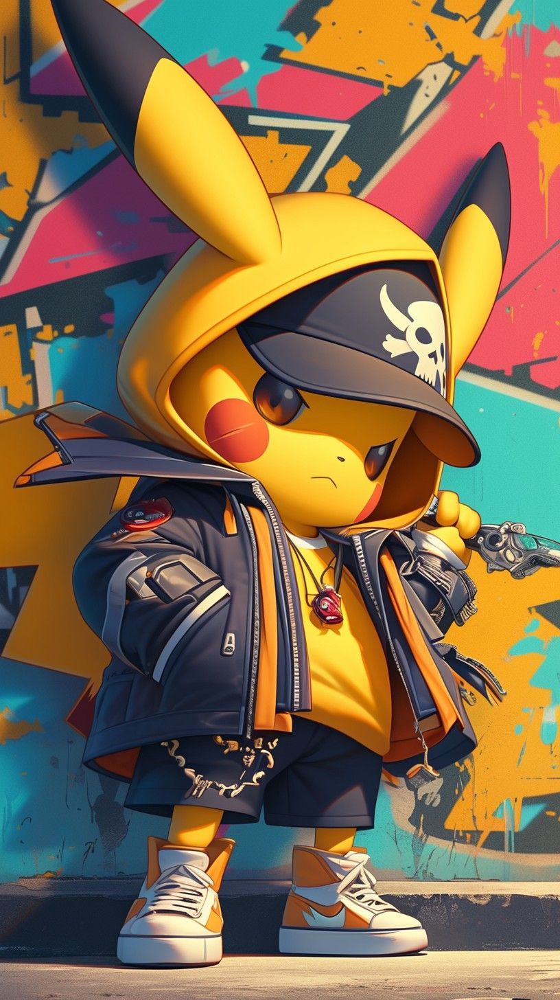

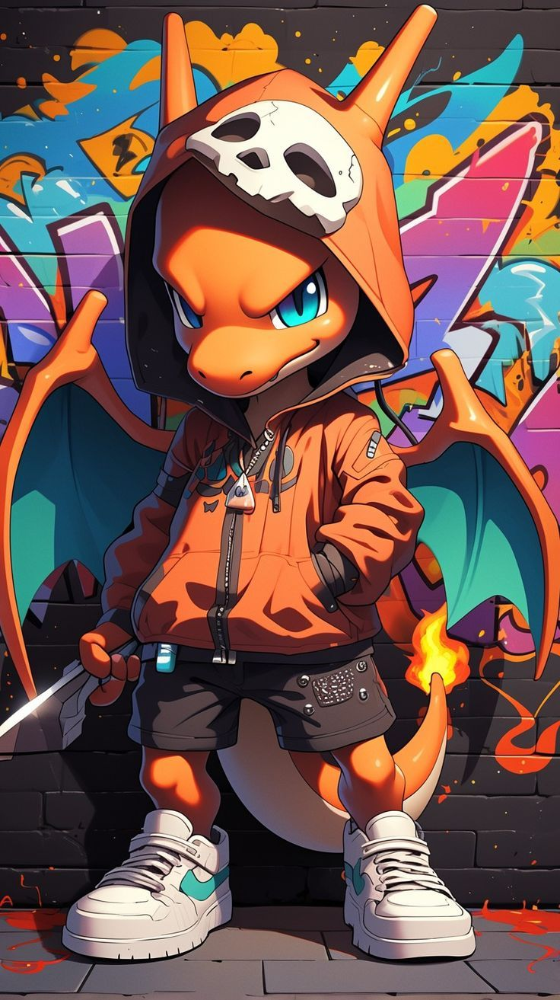

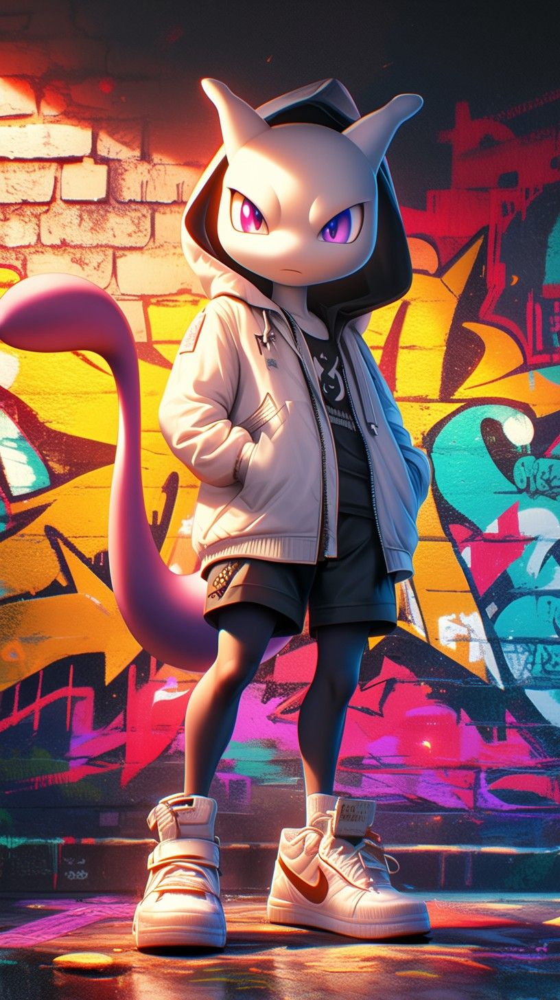

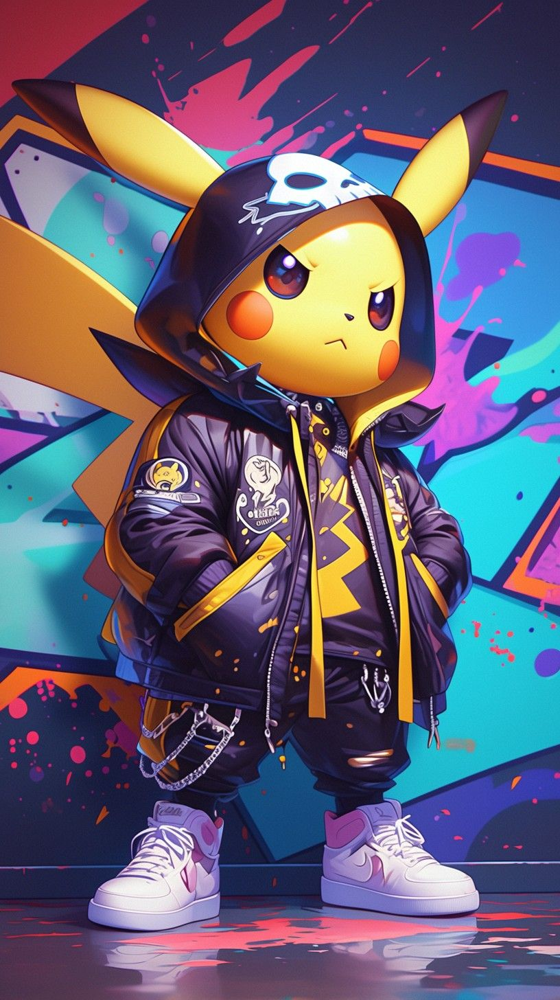

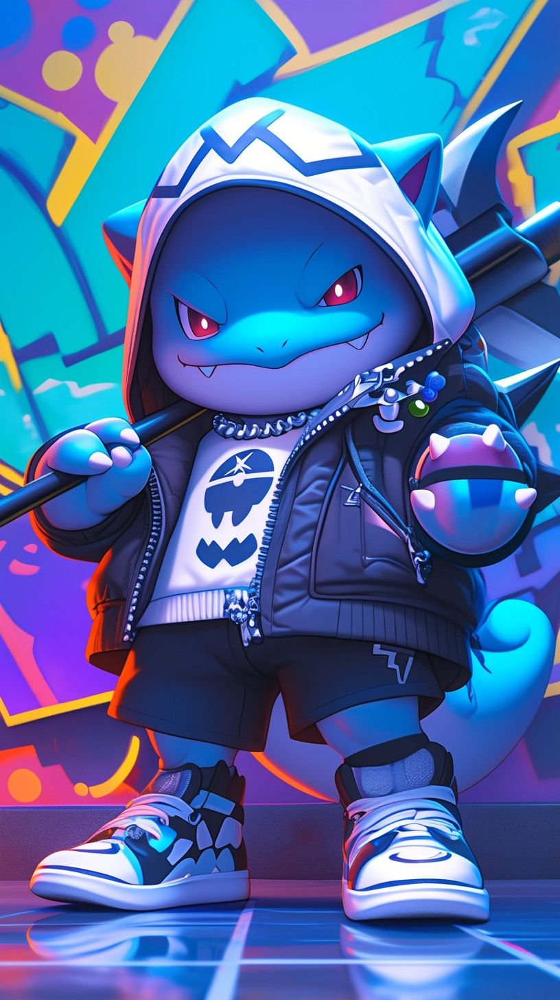

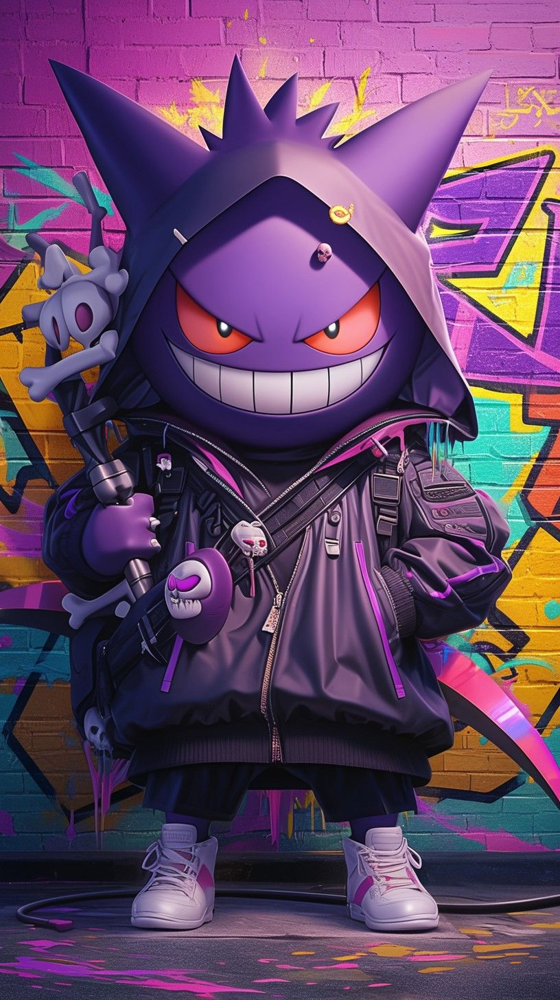

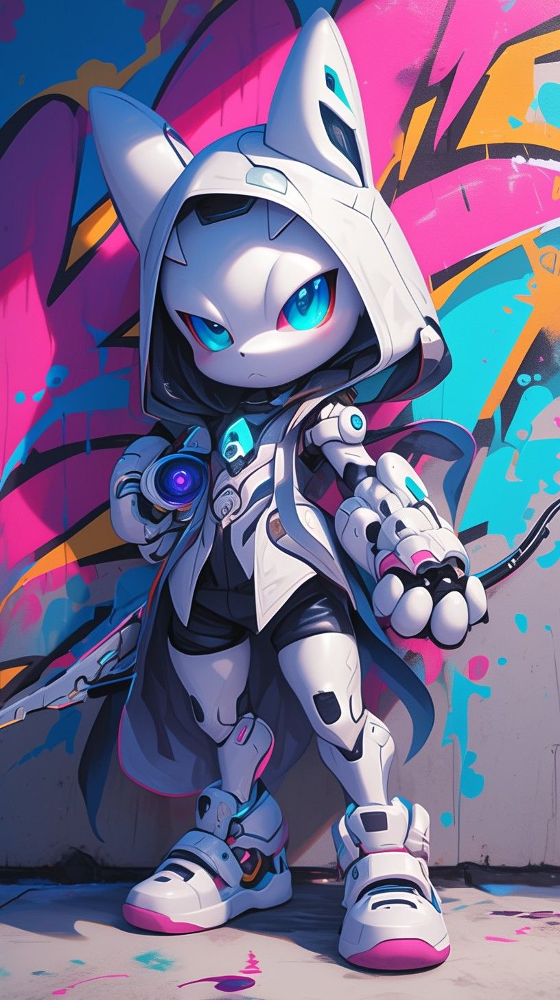

In [20]:
# Entramos la imagen para buscar similuded
imag_p = Image.open("Picachu_hiphop.jpg")
# Esta función obtiene las similudes a utilizar en la función obtener recomendaciones
entrada_imagen_sim_scores = similitud(imag_p)
# Aqui obetemod las recomendaciones de la categorias recomendadas
recomendaciones = obtener_recomendaciones(entrada_imagen_sim_scores)
# Revisamas las recomendaciones
mostrar_recomendaciones()
# Mostrar las imagenes recomedadas
mostrar_imagenes_recomendadas()
